<a href="https://colab.research.google.com/github/federicocanzonieri/DeepLearning/blob/main/DeepLearning_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pytorch_lightning

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from tqdm import tqdm
from torchvision.utils import save_image, make_grid
import pytorch_lightning as pl
from torch.optim import Adam
from torch.nn import functional as F

In [ ]:
class Encoder(nn.Module):
  def __init__(self, input_dim, hidden_dim, latent_dim):
    super(Encoder, self).__init__()
    # Un semplice encoder con due layer fully connected
    self.backbone = nn.Sequential(nn.Linear(input_dim, hidden_dim),
                                  nn.ReLU(),
                                  nn.Linear(hidden_dim, hidden_dim),
                                  nn.ReLU())

    # Definiamo inoltre due layer lineari, uno per la media e uno per la varianza
    self.mean = nn.Linear(hidden_dim, latent_dim)
    self.log_var = nn.Linear(hidden_dim, latent_dim)
    #assumeremo che l'encoder dia in output il logaritmo della varianza
  
  def forward(self, x):
    #processiamo l'input attraverso i due layer fully connected
    h = self.backbone(x)
    
    #calcoliamo media e varianza
    mu = self.mean(h)
    log_var = self.log_var(h)
    
    # print(h.shape,mu.shape,log_var.shape)

    return mu, log_var

# encoder=Encoder(50,20,10)
# print(encoder)
# encoder(torch.Tensor(np.ones(50)))

class Decoder(nn.Module):
  def __init__(self, latent_dim, hidden_dim, output_dim):
    super(Decoder, self).__init__()
    #anche in questo caso abbiamo due layer fully connected
    #seguiti da un layer di output
    self.backbone = nn.Sequential(
                      nn.Linear(latent_dim, hidden_dim),
                      nn.ReLU(),
                      nn.Linear(hidden_dim, hidden_dim),
                      nn.ReLU(),
                      nn.Linear(hidden_dim, output_dim))
  
  def forward(self, x):
    #processiamo l'input con l'MLP
    h = self.backbone(x)
    #applichiamo una attivazione di tipo
    #sigmoide per convertire gli output 
    #tra zero e uno (valori di grigio o probabilità)
    x_pred = torch.sigmoid(h)
    # print(h.shape,x_pred.shape)

    return x_pred

# decoder=Decoder(10,20,50)
# print(decoder)
# decoder(encoder(torch.Tensor(np.ones(50)))[0])

In [ ]:
class VAE(pl.LightningModule):
  def __init__(self,input_dim,hidden_dim,latent_dim,output_dim,beta):
    super(VAE,self).__init__()
    self.encoder=Encoder(input_dim,hidden_dim,latent_dim)
    self.decoder=Decoder(latent_dim,hidden_dim,input_dim)
    self.beta=beta

  def reparameterization_trick(self,mean,std):
    epsilon=std.new(std.shape).normal_()
    
    z=mean+std*epsilon
    # print(z.shape,mean.shape,std.shape)
    return z

  def forward(self,x):

      mean, log_var = self.encoder(x)
      std = torch.exp(0.5 * log_var)

      z=self.reparameterization_trick(mean,std)
      x_pred=self.decoder(z)

      return x_pred,mean,log_var

  def configure_optimizers(self):
    optimizer = Adam(self.parameters(), lr=1e-3)
    return optimizer

  def training_step(self,train_batch,batch_idx):
    x,_ =train_batch

    x_pred,mean,log_var=self.forward(x)
    rec_loss=F.binary_cross_entropy(x_pred,x,reduction='sum')
    kl_loss=-0.5 * torch.sum(1+log_var-mean**2-log_var.exp())

    loss=rec_loss+self.beta*kl_loss
    self.log('train/reconstruction_loss', rec_loss.item())
    self.log('train/kl_loss', kl_loss.item())
    self.log('train/loss', loss.item())
    return loss

   
  def validation_step(self, val_batch, batch_idx):
    x, _ = val_batch #scartiamo le etichette
    x_pred, mean, log_var = self.forward(x)
    
    reconstruction_loss = F.binary_cross_entropy(x_pred, x, reduction='sum')
    kl_loss = - 0.5 * torch.sum(1+ log_var - mean**2 - log_var.exp())
    
    #calcoliamo la loss di validation come fatto per la loss di training
    loss = reconstruction_loss + self.beta*kl_loss
    self.log('val/reconstruction_loss', reconstruction_loss.item())
    self.log('val/kl_loss', kl_loss.item())
    self.log('val/loss', loss.item())

    if batch_idx==0:
      return {'inputs': x, 'outputs': x_pred}

  def validation_epoch_end(self,results):
     images_in=results[0]['inputs'].view(-1,1,28,28)[:50,...]
     images_out=results[0]['outputs'].view(-1,1,28,28)[:50,...]
     
     self.logger.experiment.add_image('input_images', make_grid(images_in, nrow=10,normalize=True),self.global_step)
     self.logger.experiment.add_image('generated_images', make_grid(images_out, nrow=10, normalize=True),self.global_step)


# PROVARE A METTERE COME LOSS LA MSE!
# PROVARE A TOGLIERE LA KL LOSS NEL VALIDATION DONE

In [ ]:
from torchvision.datasets import MNIST
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

mnist_transform = transforms.Compose([
                  transforms.ToTensor(), 
                  torch.flatten
                  #non normalizziamo per media e deviazione standard: vogliamo che i target siamo
                  #compresi tra 0 e 1
                  ])
#definiamo i dataset e data loader di training e test
mnist_train_dataset = MNIST('mnist', transform=mnist_transform, train=True, download=True)
mnist_test_dataset = MNIST('mnist', transform=mnist_transform, train=False, download=True)
mnist_train_loader = DataLoader(dataset=mnist_train_dataset, batch_size=1024, shuffle=True, num_workers=4)
mnist_test_loader = DataLoader(dataset=mnist_test_dataset, batch_size=1024, shuffle=False, num_workers=4)
# mnist_train_dataset[0][0]
mnist_fc_vae = VAE(784, 512, 128, 784, beta=10)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir tb_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1327), started 0:32:16 ago. (Use '!kill 1327' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger("tb_logs", name="fc_vae")

trainer = pl.Trainer(max_epochs=50, gpus=0, logger=logger) 
trainer.fit(mnist_fc_vae, mnist_train_loader, mnist_test_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name    | Type    | Params
------------------------------------
0 | encoder | Encoder | 795 K 
1 | decoder | Decoder | 730 K 
------------------------------------
1.5 M     Trainable params
0         Non-trainable params
1.5 M     Total params
6.107     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Training: -1it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

In [ ]:
def sample(n):

  z=torch.randn((n,128)) ### CREAIAMO UN Z vector di dim (x,128) CAMP da una normale
  images=mnist_fc_vae.decoder(z)
  print(len(images))
  images = [x.reshape(28,28).detach().cpu().numpy() for x in images]
  if n==1:
    return images[0]
  return images



24


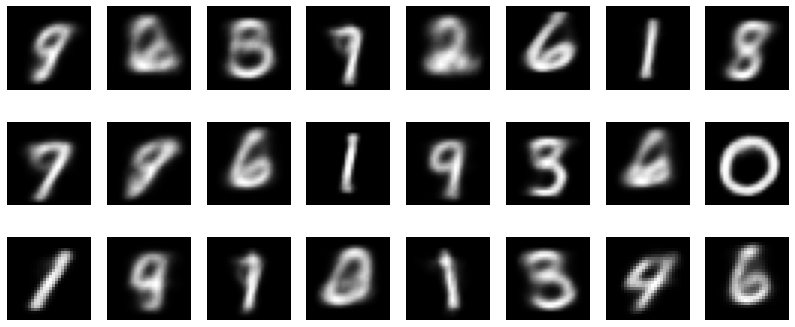

In [ ]:
from matplotlib import pyplot as plt
ims = sample(24) #generiamo 24 immagini
i=1
#stampiamoli in una griglia mediante subplot
plt.figure(figsize=(14,6))
for im in ims:
  plt.subplot(3,8,i)
  i+=1
  plt.imshow(im,cmap='gray')
  plt.axis('off')
plt.show()

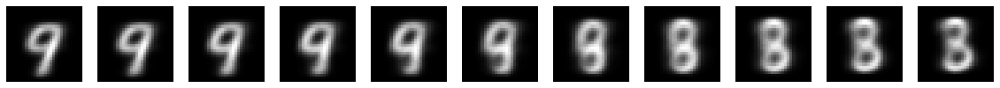

In [ ]:
z1 = torch.randn(128)
z2 = torch.randn(128)
plt.figure(figsize=(20,4))
i=1
#generiamo 11 coppie di coefficienti (alpha, 1-aplha)
#che variano da 0 a 1
for alpha in np.arange(0,1.1,0.1):
  #combinazione lineare
  z = z1*alpha + (1-alpha)*z2
  #generazione dell'immagine
  im = mnist_fc_vae.decoder(z).detach().cpu().numpy().reshape(28,28)
  #plot
  plt.subplot(1,11,i)
  i+=1
  plt.imshow(im, cmap='gray')
  plt.axis('off')

[5.7 1.6]
[5.   1.96]
[4.3  2.32]
[3.6  2.68]
[2.9  3.04]
[2.2 3.4]


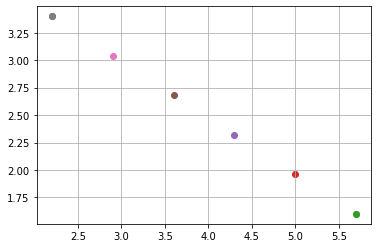

In [ ]:
z1=np.array([[2.2],[3.4]])
z2=np.array([[5.7],[1.6]])
plt.scatter(z1[0],z1[1])
plt.scatter(z2[0],z2[1])

plt.grid()
for alpha in np.arange(0,1.1,0.2):
  z = z1*alpha + (1-alpha)*z2
  plt.scatter(z[0],z[1])
  print(z.reshape(-1))



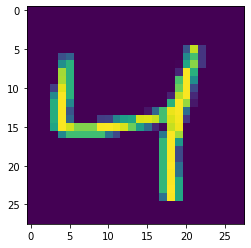

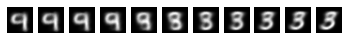

In [ ]:
z1, _ = mnist_fc_vae.encoder(mnist_train_dataset[0][0])
z2, _ = mnist_fc_vae.encoder(mnist_train_dataset[2][0])
plt.figure(figsize=(20,4))
plt.imshow(mnist_train_dataset[0][0].reshape(28,28))
plt.imshow(mnist_train_dataset[2][0].reshape(28,28))
plt.show()
i=1
#generiamo 11 coppie di coefficienti (alpha, 1-aplha)
#che variano da 0 a 1
for alpha in np.arange(0,1.1,0.1):
#combinazione lineare
  z = z1*alpha + (1-alpha)*z2
  #generazione dell'immagine
  im = mnist_fc_vae.decoder(z).detach().cpu().numpy().reshape(28,28)
  #plot
  plt.subplot(1,11,i)
  i+=1
  plt.imshow(im, cmap='gray')
  plt.axis('off')

In [ ]:
def extract_codes(model, loader):
  codes, labels = [], []
  for batch in loader:
    x = batch[0]
    code, *_ = model(x)
    code = code.detach().to('cpu').numpy()
    labels.append(batch[1])
    codes.append(code)
  return np.concatenate(codes), np.concatenate(labels)

In [ ]:
from sklearn.manifold import TSNE
codes, labels = extract_codes(mnist_fc_vae.encoder, mnist_test_loader)
selected_codes = np.random.choice(len(codes),1000)
codes = codes[selected_codes]
labels = labels[selected_codes]
tsne = TSNE(2)
codes_tsne=tsne.fit_transform(codes)

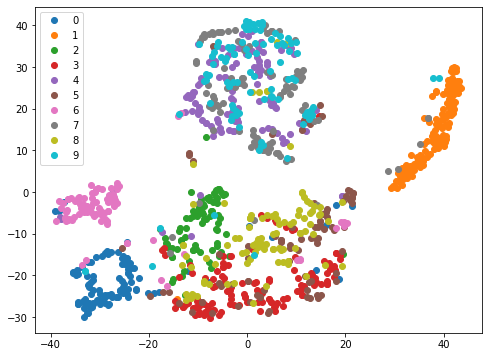

In [ ]:
from matplotlib import pyplot as plt
plt.figure(figsize=(8,6))
for c in np.unique(labels)*2:
  plt.plot(codes_tsne[labels==c, 0], codes_tsne[labels==c, 1], 'o', label = c)
plt.legend()
plt.show()

# GAN

In [ ]:
import os
from argparse import ArgumentParser, Namespace
from collections import OrderedDict
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import MNIST
from pytorch_lightning.core import LightningModule
from pytorch_lightning.trainer import Trainer
import pytorch_lightning as pl
from torchvision.utils import save_image, make_grid

In [ ]:
class Generator(nn.Module):
  def __init__(self,latent_dim,img_shape):
    super().__init__()
    self.init_size = img_shape[1] // 4
    # usiamo un layer lineare per proiettare il vettore latente su
    # una mappa iniziale di dimensione 128 * 8 * 8
    # useremo una view per trasformare questo vettore in una mappa 128 x 8 x 8 n
    # el metodo forward
    self.l1 = nn.Sequential(nn.Linear(latent_dim, 128 * self.init_size ** 2))
    self.conv_blocks = nn.Sequential(
    # usiamo le batch normalization
    # per accelerare il training
    nn.BatchNorm2d(128),
    # questo layer fa upsampling della mappa 8x8 e la fa diventare 16x16
    nn.Upsample(scale_factor=2),
    #convoluzione con padding=1 per mantenere la stessa dimensione 16x16
    nn.Conv2d(128, 128, 3, stride=1, padding=1),
    nn.BatchNorm2d(128, 0.8),
    nn.LeakyReLU(0.2, inplace=True), #usiamo le leaky relu invece delle relu
    #queste funzionano meglio con le GAN
    nn.Upsample(scale_factor=2), #16x16 -> 32x32
    nn.Conv2d(128, 64, 3, stride=1, padding=1),
    nn.BatchNorm2d(64, 0.8),
    nn.LeakyReLU(0.2, inplace=True),
    #layer finale di convluzioni che fa passare da 64 canali a 3
    nn.Conv2d(64, img_shape[0], 3, stride=1, padding=1),
    nn.Sigmoid()
    )

  def forward(self,z):
    out = self.l1(z)
    #la view serve per passare da un vettore a una mappa di feature
    out = out.view(out.shape[0], 128, self.init_size, self.init_size)
    img = self.conv_blocks(out)
    return img

class Discriminator(nn.Module):
  def __init__(self, img_shape):
    super(Discriminator, self).__init__()
    #definisce un "blocco del discriminatore"
    def discriminator_block(in_feat, out_feat, bn=True):
    #questo include una convoluzione, una LeakyReLU, e un dropout
      block = [nn.Conv2d(in_feat, out_feat, 3, 2, 1), nn.LeakyReLU(0.2, inplace=True), nn.Dropout2d(0.25)]
      if bn:
      #se richiesto inseriamo la batch normalization
        block.append(nn.BatchNorm2d(out_feat, 0.8))
      return block
    #costruisce il modulo principale
    #solo il primo layer ha la batch normalization
    self.model = nn.Sequential(
    *discriminator_block(img_shape[0], 16, bn=False),
    *discriminator_block(16, 32),
    *discriminator_block(32, 64),
    *discriminator_block(64, 128),
    )
    # alla fine delle convoluzioni avremo una mappa a dimensionalità ridotta
    ds_size = img_shape[1] // 2 ** 4
    #usiamo un layer lineare e un sigmoide per ottenere la classificazione
    self.adv_layer = nn.Sequential(nn.Linear(128 * ds_size ** 2, 1), nn.Sigmoid
    ())
  def forward(self, img):
    out = self.model(img)
    #la view serve per passare dalla mappa di feature al vettore linearizzato
    out = out.view(out.shape[0], -1)
    validity = self.adv_layer(out)
    return validity



In [ ]:
import torchvision
from collections import OrderedDict
class DCGAN(LightningModule):
  def __init__(self,
    latent_dim: int = 100,
    lr: float = 0.0002,
    b1: float = 0.5,
    b2: float = 0.999,
    batch_size: int = 64, **kwargs):
    super().__init__()
    #questo metodo conserva una copia degli iperparametri alla quale accedere in 
    # seguito
    self.save_hyperparameters()
    self.latent_dim = latent_dim
    self.lr = lr
    self.b1 = b1
    self.b2 = b2
    self.batch_size = batch_size
    # la dimensione dell'immagine in input# networks
    img_shape = (1, 32, 32)
    #costruisce generatore e discriminatore 
    self.generator = Generator(latent_dim=self.latent_dim, img_shape=img_shape)
    self.discriminator = Discriminator(img_shape=img_shape)
    #conserva un insieme di codici di validazione da tenere fissi
    #per monitorare l'evoluzione della rete
    self.validation_z = torch.randn(50, self.latent_dim)
    #un esempio di input del modello
    self.example_input_array = torch.zeros(2, self.latent_dim)
  def forward(self, z):
  #in fase di forward usiamo solo il generatore
    return self.generator(z)
  
  def configure_optimizers(self):
    lr = self.lr
    b1 = self.b1
    b2 = self.b2
    # per implementare la procdura di ottimizzazione alternata,
    # definiamo due ottimizzatori invece di uno
    opt_g = torch.optim.Adam(self.generator.parameters(), lr=lr, betas=(b1, b2))
    opt_d = torch.optim.Adam(self.discriminator.parameters(), lr=lr, betas=(b1,
    b2))
    # restituiamo dunque una lista contenente i due ottimizzatori
    # la lista vuota indica gli scheduler, che non specifichiamo
    return [opt_g, opt_d], []


  def training_step(self, batch, batch_idx, optimizer_idx):
# questo metodo verrà chiamato due volte, una per ogni ottimizzatore definit
# o
# optimizer_idx permetterà di distinguere tra i due ottimizzatori
    imgs, _ = batch #scartiamo le etichette del batch
# campioniamo dei vettori di rumore random
# questi ci serviranno sia per il training del generatore 
# che per quello del discriminatore
    z = torch.randn(imgs.shape[0], self.latent_dim)
    # ci assicuriamo che il "tipo" sia lo stesso delle immagini (es. entrambi so
    # no su GPU)
    z = z.type_as(imgs)
    # primo ottimizzatore: alleniamo il generatore
    if optimizer_idx == 0:
    # generiamo le immagini dai vettori random
      generated_imgs = self(z)
      # prendiamo le prime 8 immagini generate e le loggiamo
      sample_imgs = generated_imgs[:8]
      grid = torchvision.utils.make_grid(sample_imgs, nrow=10)
      self.logger.experiment.add_image('generated_images', grid, self.global_step)
      # definiamo le etichette delle immagini che abbiamo generato
      # durante il training del generatore, vogliamo che vengano viste come "r
      # eal" (etichetta 1)
      valid = torch.ones(imgs.size(0), 1)
      valid = valid.type_as(imgs) #mettiamole sul device corretto cambiandone 
      # il tipo
      # loss del generatoreetichette predette per le immagini generate
      g_loss = F.binary_cross_entropy(self.discriminator(self(z)), valid)
      self.log('generator/loss', g_loss.item())
      # restituiamo la loss più qualche statistica per la visualizzazione
      tqdm_dict = {'g_loss': g_loss}
      output = OrderedDict({
      'loss': g_loss,
      'progress_bar': tqdm_dict,
      'log': tqdm_dict
      })
      return output
    # allenamento del discriminatore
    if optimizer_idx == 1:
    # etichette delle immagini reali in imgs
      valid = torch.ones(imgs.size(0), 1)
      valid = valid.type_as(imgs)
      # otteniamo le predizioni per le immagini reali
      predicted_real_labels = self.discriminator(imgs)
      # loss per classificare bene le immagini reali
      real_loss = F.binary_cross_entropy(predicted_real_labels, valid)
      # adesso dobbiamo ripetere il processo per i fake
      # etichette fake: tutti zeri# how well can it label as fake?
      fake = torch.zeros(imgs.size(0), 1)
      fake = fake.type_as(imgs)
      # generiamo le predizioni per le immagini fake
      predicted_fake_images = self(z).detach()
      predicted_fake_labels = self.discriminator(predicted_fake_images)
      # loss per fake
      fake_loss = F.binary_cross_entropy(
      predicted_fake_labels, fake)
    
    # calcoliamo la loss del discriminatore come media fra le due
      d_loss = (real_loss + fake_loss) / 2
      # log della loss del discriminatore
      self.log('discriminator/loss', d_loss.item())
      
      # calcoliamo l'accuracy fake e real
      d_fake_acc = (predicted_fake_labels<=0.5).float().mean()
      d_real_acc = (predicted_real_labels>0.5).float().mean()
      #accuracy finale
      d_acc = (d_fake_acc + d_real_acc)/2
      
      # log
      self.log('discriminator/fake_acc', d_fake_acc.item())
      self.log('discriminator/real_acc', d_real_acc.item())
      self.log('discriminator/overall_acc', d_acc.item())
      tqdm_dict = {'d_loss': d_loss}
      output = OrderedDict({
      'loss': d_loss,
      'progress_bar': tqdm_dict,
      'log': tqdm_dict
      })
      return output

  def train_dataloader(self):
    transform = transforms.Compose([
    transforms.Resize((32, 32)), #resize a 32x32 -> la rete è stata progetta
    # ta per questa dimensione
    transforms.ToTensor(),
    ])
    dataset = MNIST(os.getcwd(), train=True, download=True, transform=transform)
    return DataLoader(dataset, batch_size=self.batch_size)

  def on_epoch_end(self):
    #alla fine dell'epoca, generiamo le immagini corrispondenti agli z di valida
    # zione
    z = self.validation_z.to(self.device)
    # generiamo le immagini# log sampled images
    sample_imgs = self(z)
    #facciamo log
    grid = torchvision.utils.make_grid(sample_imgs, nrow=10)
    self.logger.experiment.add_image('validation_images', grid, self.global_step)



mnist_gan = DCGAN()

In [ ]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger("tb_logs", name="mnist_gan")
trainer = pl.Trainer(gpus=0, logger=logger, max_epochs=10)
trainer.fit(mnist_gan)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name          | Type          | Params | In sizes | Out sizes     
----------------------------------------------------------------------------
0 | generator     | Generator     | 1.0 M  | [2, 100] | [2, 1, 32, 32]
1 | discriminator | Discriminator | 98.1 K | ?        | ?             
----------------------------------------------------------------------------
0         Trainable params
1.1 M     Non-trainable params
1.1 M     Total params
4.592     Total estimated model params size (MB)


Training: -1it [00:00, ?it/s]

RuntimeError: ignored

In [ ]:
torch.save(mnist_gan,"mnist-gan")

In [ ]:
def sample(n):
  #passo 1: generiaom n vettori latenti che seguono la distribuzione normale
  z = torch.randn((n, 100))
  #passo 2: convertiamo gli n vettori in imagini mediante il decoder del VAE
  images = mnist_gan(z)
  images = [x.reshape(32,32).detach().cpu().numpy() for x in images]
  if n==1:
    return images[0]
  else:
    return images

In [ ]:
from matplotlib import pyplot as plt
ims = sample(24) #generiamo 24 immagini
i=1
#stampiamoli in una griglia mediante subplot
plt.figure(figsize=(14,6))
for im in ims:
  plt.subplot(3,8,i)
  i+=1
  plt.imshow(sample(1),cmap='gray')
  plt.axis('off')
plt.show()

In [ ]:
z1 = torch.randn(1,100)
z2 = torch.randn(1,100)
plt.figure(figsize=(20,4))
i=1
#generiamo 11 coppie di coefficienti (alpha, 1-aplha)
#che variano da 0 a 1
for alpha in np.arange(0,1.1,0.1):
#combinazione lineare
  z = z1*alpha + (1-alpha)*z2
  #generazione dell'immagine
  im = mnist_gan(z).detach().cpu().numpy().reshape(32,32)
  #plot
  plt.subplot(1,11,i)
  i+=1
  plt.imshow(im, cmap='gray')
  plt.axis('off')